<a href="https://colab.research.google.com/github/Jhonyd55/Iperf3-GUI/blob/main/wine_data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **🍷 Análisis Exploratorio de Datos: Calidad del Vino **

---
 Este notebook realiza un análisis exploratorio sobre el dataset "Wine Quality (Red Wine)", también se puede modificar el código para hacer pruebas con el vino blanco o todas las muestras de vino.
disponible en el repositorio **UCI Machine Learning.**
### Autor: **Jhony Michael Durán Ramírez**

https://archive.ics.uci.edu/dataset/186/wine+quality

#### **Instalar complementos necesarios y descargar la base de datos**

In [255]:
# @title instalar complementos si no estan instalados
import importlib.util
import subprocess
import sys

def install_package(package_name):
    if importlib.util.find_spec(package_name) is None:
      print(f"🔧 Instalando {package_name}...")
      subprocess.check_call([sys.executable, "-m", "pip", "install", package_name])
      print(f"{package_name} instalado con éxito.")
    else:
      print(f"{package_name} ya está instalado.")

package_name = "plotly"
install_package(package_name)
package_name = "ucimlrepo"
install_package(package_name)

plotly ya está instalado.
ucimlrepo ya está instalado.


### **Librerías Necesarias**
* Pandas
* Seaborn
* Matplotlib.pyplot
* Plotly.express
    

In [256]:

# 📦 Librerías necesarias
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import os
import pickle
from ucimlrepo import fetch_ucirepo, list_available_datasets
#list_available_datasets()


### **Configuraciones de visualización**
---

In [257]:
# @title parametros para sns
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

### **Cargar base de datos**
---

In [258]:


# @title 📂 Nombre del archivo local para cachear
cache_file = "wine_quality_uciml.pkl"

# 📥 Función para cargar desde cache o descargar
def load_wine_dataset():
    if os.path.exists(cache_file):
        print("✅ Dataset encontrado en caché local.")
        with open(cache_file, "rb") as f:
            wine_quality = pickle.load(f)
    else:
        print("🔽 Descargando dataset desde UCIML...")
        wine_quality = fetch_ucirepo(id=186)
        with open(cache_file, "wb") as f:
            pickle.dump(wine_quality, f)
        print("💾 Dataset guardado localmente.")
    return wine_quality

# 🚀 Cargar dataset
wine_quality = load_wine_dataset()
# Selecciona:
# [1] para analisis de vino tinto
# [2] Para analisis de vino blanco
# [3] Para indistinto rojo o blanco
variant = 2
# 🧮 Separar variables predictoras y objetivo
#X = wine_quality.data.features
X = wine_quality.data.original.copy()
if variant == 1:
    X = X.loc[X['color'] == "red"]
elif variant == 2:
    X = X.loc[X['color'] == "white"]
elif variant == 3:
    pass
    # Define el mapeo de los valores antiguos a los nuevos
    reemplazo_color = {
        "red": 1,
        "white": 0
    }

    # Aplica el reemplazo a la columna 'color' en el DataFrame X
    X['isRed'] = X['color'].replace(reemplazo_color)

else:
    raise ValueError("Variant debe ser 1, 2 o 3")

y = X["quality"].copy()
X = X.drop(columns=["quality","color"])

# 👀 Vista previa
X.head()



✅ Dataset encontrado en caché local.


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
1599,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8
1600,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5
1601,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1
1602,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9
1603,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9


In [259]:
# @title metadata

import json

datos = wine_quality.metadata

json_string = json.dumps(datos, indent=3)
print(json_string)

{
   "uci_id": 186,
   "name": "Wine Quality",
   "repository_url": "https://archive.ics.uci.edu/dataset/186/wine+quality",
   "data_url": "https://archive.ics.uci.edu/static/public/186/data.csv",
   "abstract": "Two datasets are included, related to red and white vinho verde wine samples, from the north of Portugal. The goal is to model wine quality based on physicochemical tests (see [Cortez et al., 2009], http://www3.dsi.uminho.pt/pcortez/wine/).",
   "area": "Business",
   "tasks": [
      "Classification",
      "Regression"
   ],
   "characteristics": [
      "Multivariate"
   ],
   "num_instances": 4898,
   "num_features": 11,
   "feature_types": [
      "Real"
   ],
   "demographics": [],
   "target_col": [
      "quality"
   ],
   "index_col": null,
   "has_missing_values": "no",
   "missing_values_symbol": null,
   "year_of_dataset_creation": 2009,
   "last_updated": "Wed Nov 15 2023",
   "dataset_doi": "10.24432/C56S3T",
   "creators": [
      "Paulo Cortez",
      "A. Cerde

In [260]:
y.head()

,quality
1599,6
1600,6
1601,6
1602,6
1603,6


### **Descripción de los Datos**
---

In [261]:
# @title 📊 Estadísticas descriptivas
variables = X.columns.tolist().copy()
X.describe()


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000


In [262]:
# @title X.info()
df_summary = pd.DataFrame({
    'Tipo de Dato': X.dtypes,
    'Valores Nulos': X.isnull().sum(),
    'Valores No Nulos': X.notnull().sum(),
    'Únicos': X.nunique(),
    #'Valores en Cero': (X == 0).sum() # Agrega esta línea para contar los cero
})

display(df_summary)

,Tipo de Dato,Valores Nulos,Valores No Nulos,Únicos
fixed_acidity,float64,0,4898,68
volatile_acidity,float64,0,4898,125
citric_acid,float64,0,4898,87
residual_sugar,float64,0,4898,310
chlorides,float64,0,4898,160
free_sulfur_dioxide,float64,0,4898,132
total_sulfur_dioxide,float64,0,4898,251
density,float64,0,4898,890
pH,float64,0,4898,103
sulphates,float64,0,4898,79


In [263]:
y.info()

<class 'pandas.core.series.Series'>
Index: 4898 entries, 1599 to 6496
Series name: quality
Non-Null Count  Dtype
--------------  -----
4898 non-null   int64
dtypes: int64(1)
memory usage: 76.5 KB


### **Analizando Datos**
----

In [264]:
# @title Distribución de datos
df = pd.concat([X, y], axis=1).copy()

In [265]:
y1=y.copy()

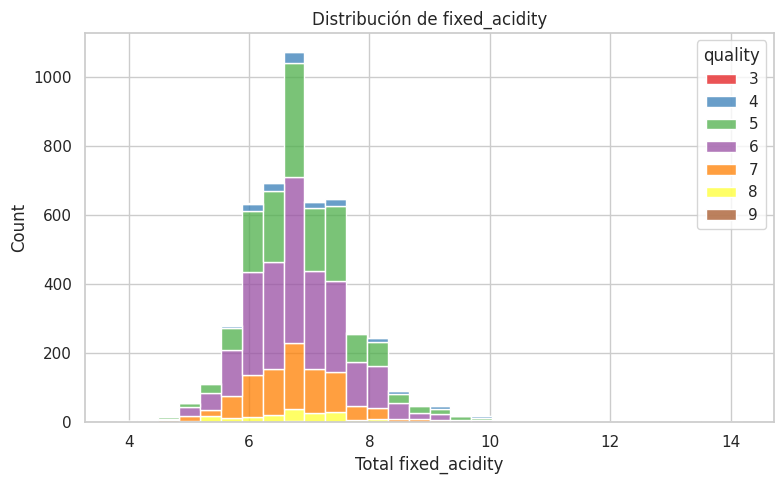

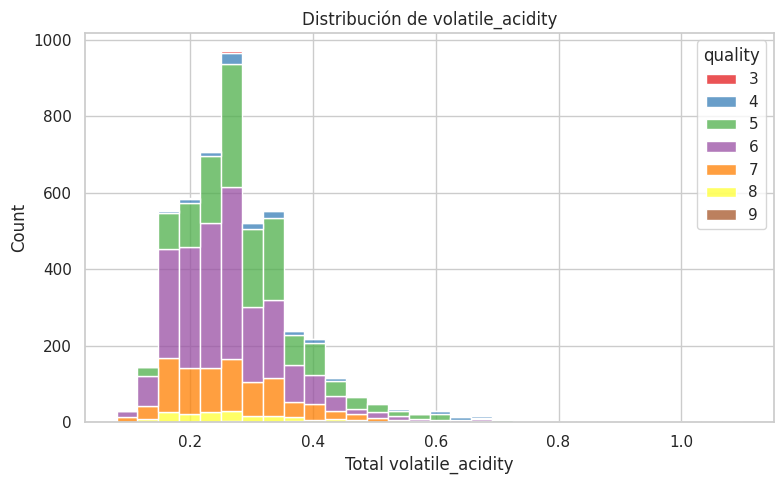

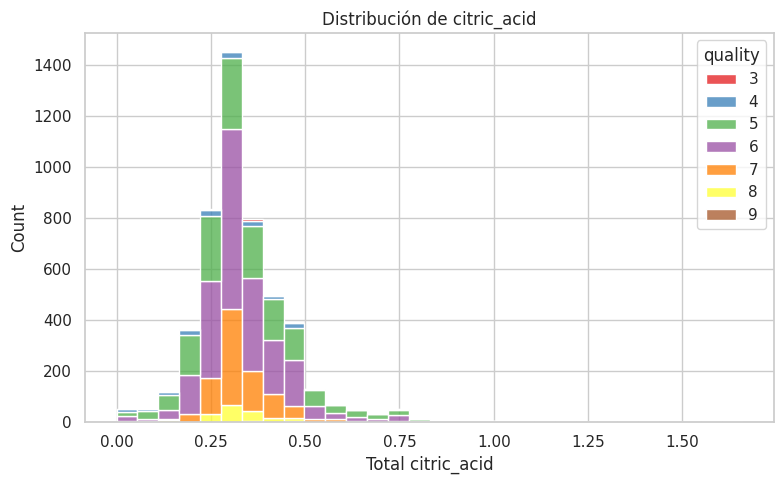

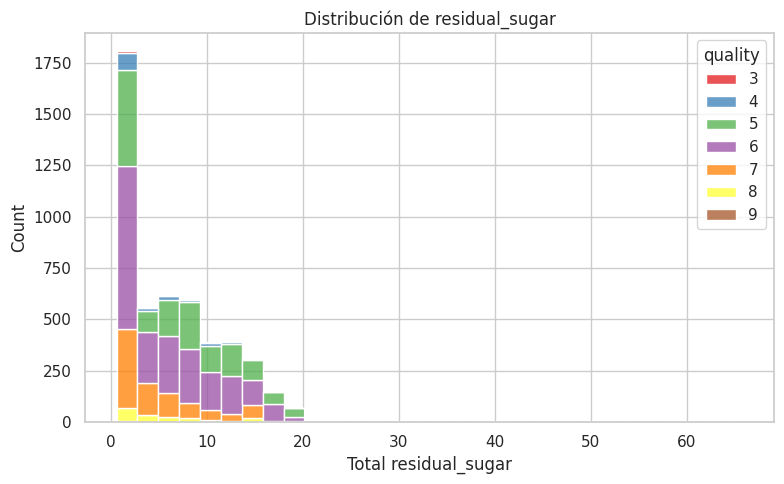

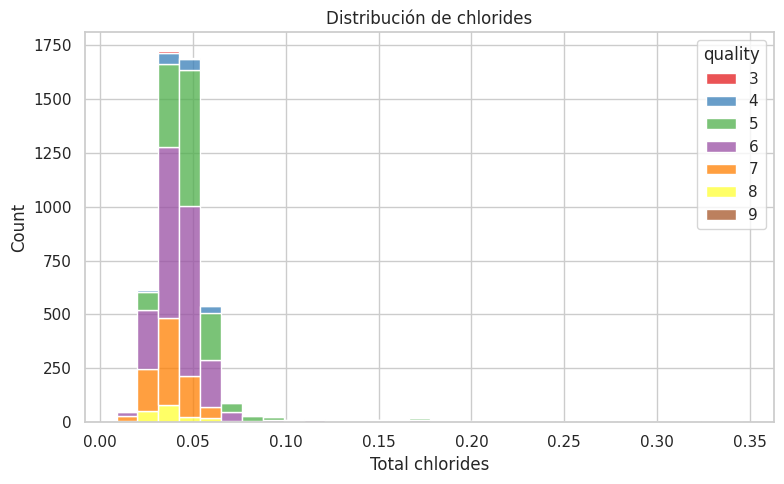

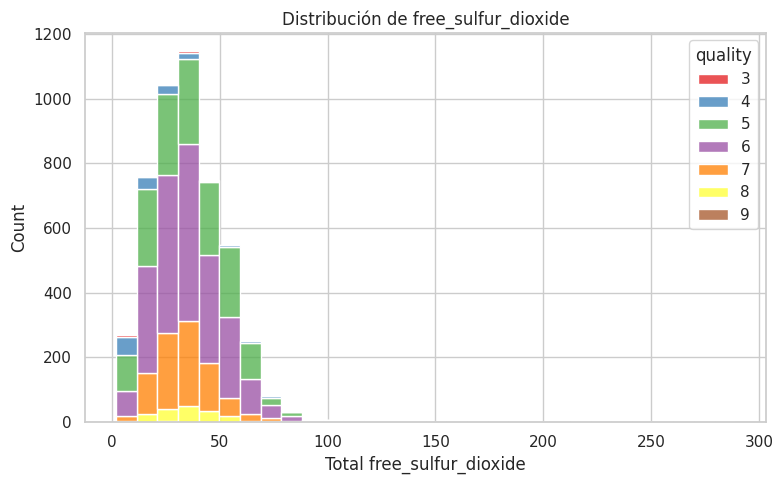

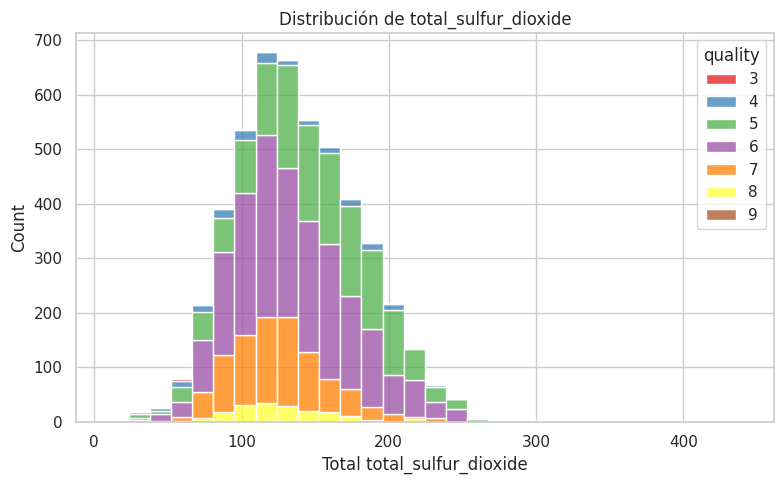

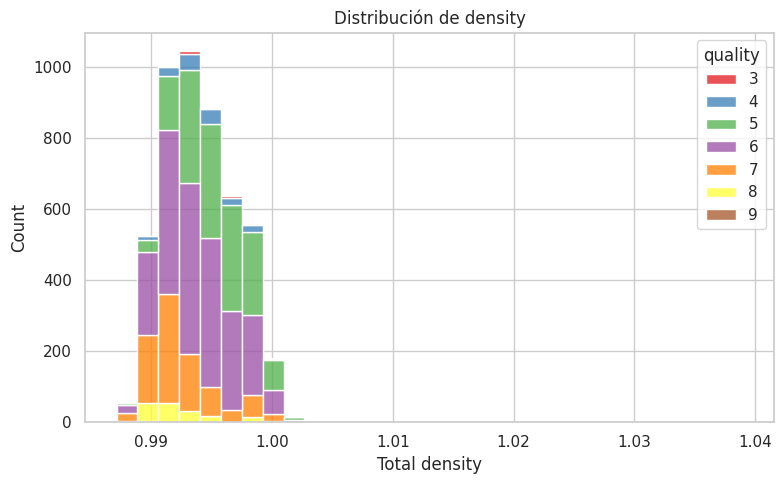

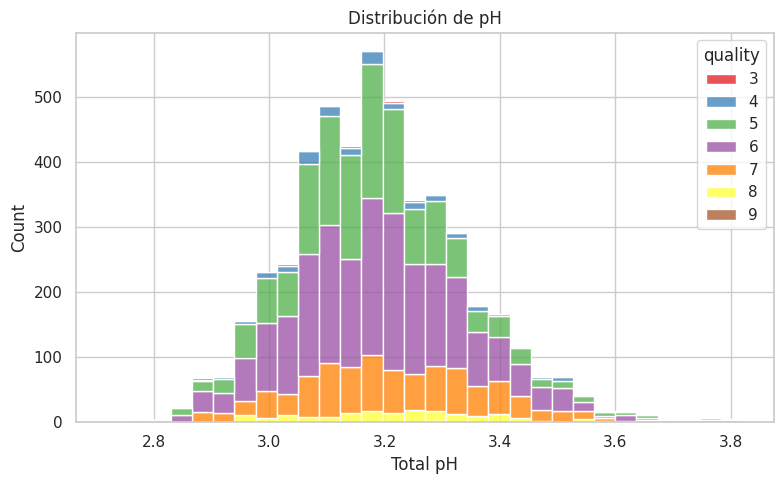

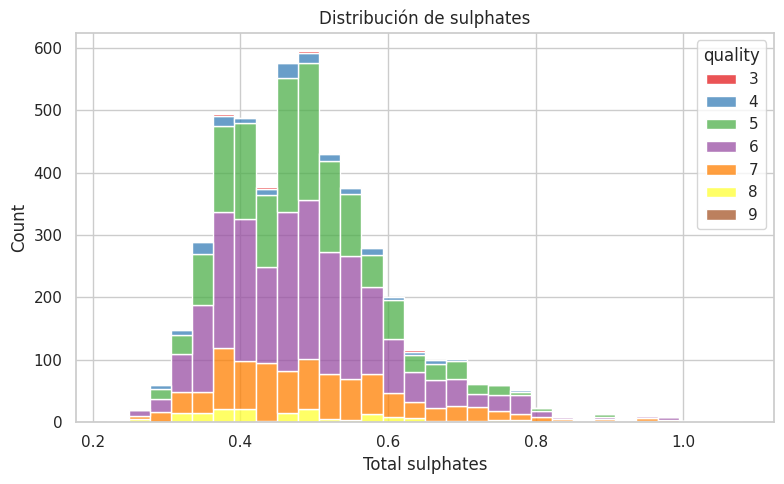

### Cantidad de valores atípicos por columna:


,Cantidad de Valores Atípicos
chlorides,168
citric_acid,144
volatile_acidity,88
sulphates,48
fixed_acidity,46
free_sulfur_dioxide,26
pH,17
total_sulfur_dioxide,7
residual_sugar,5
density,3


In [266]:
# @title Detectando Posibles Valores Atípicos  **(outliers)**
# Detección de valores atípicos usando Z-Score modificado
import numpy as np

def detectar_atipicos_zmod(df, umbral=3.5):
    outliers = {}

    for col in df.select_dtypes(include='number'):
        x = df[col]
        mediana = x.median()
        mad = np.median(np.abs(x - mediana))

        if mad == 0:
            continue  # Evitar división por cero

        zmod = 0.6745 * (x - mediana) / mad
        mask_outliers = np.abs(zmod) > umbral
        outliers[col] = df[mask_outliers][col]

    return outliers

# Modificamos la función histogram para manejar las leyendas explícitamente
def histogram(df, col, hue=None):
    sns.set_theme(style="whitegrid")
    fig, ax = plt.subplots(figsize=(8, 5)) # Creamos la figura y los ejes explícitamente

    # Generar el histograma en los ejes creados
    hist_plot = sns.histplot(
        data=df,
        x=col,
        hue=hue,
        bins=30,
        # color="skyblue", # 'color' se anula si se usa 'hue' y 'palette'
        multiple="stack",
        palette="Set1",  # 🎨 Paleta con colores bien diferenciados
        ax=ax # Especificamos los ejes donde dibujar
    )

    ax.set_xlabel("Total " + col)
    ax.set_title("Distribución de " + col)

    # Lista para almacenar handles y labels para la leyenda final
    all_handles = []
    all_labels = []

    # Obtener handles y labels de Seaborn (para 'hue')
    # seaborn.histplot no tiene un .get_legend_handles_labels() directo en el objeto retornado.
    # Debemos obtenerlos de los ejes después de que Seaborn dibuja.
    # Obtenemos la leyenda de hue que Seaborn pudo haber creado
    handles, labels = ax.get_legend_handles_labels()

    # Añadir los handles y labels de hue a nuestra lista
    all_handles.extend(handles)
    all_labels.extend(labels)

    # Añadir la línea de la media en los ejes creados
    #if pd.api.types.is_numeric_dtype(df[col]):
    #    line_handle = ax.axvline(df[col].mean(), color='red', linestyle='--', label='Media')
        # Añadir el handle y label de la línea de la media a nuestra lista
    #    all_handles.append(line_handle)
    #    all_labels.append('Media') # Especificamos el label aquí

    # Crear la leyenda final combinando todos los handles y labels
    if all_handles: # Solo crear leyenda si hay algo que mostrar
        ax.legend(handles=all_handles, labels=all_labels)


    plt.tight_layout()
    # Eliminamos plt.show() de la función para que se muestre en el bucle principal

    return fig, ax # Retornamos la figura y los ejes

outliers = detectar_atipicos_zmod(df)
conteo_atipicos = {}
for col, vals in outliers.items():
    if not vals.empty:
        fig, ax = histogram(df, col, "quality")

        # Ahora mostramos la figura. Esto mostrará el gráfico con la leyenda de hue y la línea de media.
        plt.show(fig) # Mostramos la figura específica
        conteo_atipicos[col] = len(vals)
# Convertir el diccionario a un DataFrame para una mejor presentación
df_conteo_atipicos = pd.DataFrame.from_dict(conteo_atipicos, orient='index', columns=['Cantidad de Valores Atípicos'])

# Opcional: Ordenar por cantidad en orden descendente
df_conteo_atipicos = df_conteo_atipicos.sort_values(by='Cantidad de Valores Atípicos', ascending=False)

print("### Cantidad de valores atípicos por columna:")

# Mostrar el DataFrame usando display
display(df_conteo_atipicos)

In [267]:
import numpy as np
import pandas as pd

def eliminar_atipicos_columnas(df, columnas_a_limpiar, umbral_zmod=3.5):
    """
    Elimina filas que contienen valores atípicos en las columnas especificadas
    utilizando el método Z-score modificado.

    Args:
      df: pandas.DataFrame, el DataFrame de entrada.
      columnas_a_limpiar: list, una lista de nombres de columnas a revisar para atípicos.
      umbral_zmod: float, el umbral para el Z-score modificado para considerar un valor atípico.

    Returns:
      pandas.DataFrame, un nuevo DataFrame sin las filas que contenían atípicos
      en las columnas especificadas.
    """
    df_limpio = df.copy() # Crear una copia para no modificar el DataFrame original
    indices_a_eliminar = set() # Usar un set para almacenar índices únicos

    for col in columnas_a_limpiar:
        if col in df_limpio.select_dtypes(include='number').columns: # Asegurar que la columna es numérica
            x = df_limpio[col]
            mediana = x.median()
            mad = np.median(np.abs(x - mediana))

            if mad == 0:
                print(f"Advertencia: MAD es cero para la columna '{col}'. No se detectarán atípicos para esta columna.")
                continue # Evitar división por cero

            zmod = 0.6745 * (x - mediana) / mad
            mask_outliers = np.abs(zmod) > umbral_zmod

            # Añadir los índices de las filas con atípicos a nuestro set
            indices_a_eliminar.update(df_limpio[mask_outliers].index)
        else:
            print(f"Advertencia: La columna '{col}' no es numérica o no existe. Se omitirá.")


    # Eliminar las filas por sus índices
    # Solo eliminamos si hay índices en el set
    if indices_a_eliminar:
        print(f"Se eliminarán {len(indices_a_eliminar)} filas que contienen valores atípicos.")
        df_limpio = df_limpio.drop(list(indices_a_eliminar))
    else:
        print("No se encontraron valores atípicos en las columnas especificadas.")

    return df_limpio

# --- Ejemplo de uso ---
# Supongamos que 'df' es tu DataFrame original
# y 'columnas_para_limpiar' es la lista de columnas que quieres limpiar.

# Ejemplo: Definir algunas columnas para limpiar
# Asegúrate de que estas columnas existen en tu DataFrame 'df'
columnas_para_limpiar = ['fixed_acidity', 'volatile_acidity', 'citric_acid',
                         'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
                         'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol']


# Llamar a la función para obtener un DataFrame limpio
df_limpio = eliminar_atipicos_columnas(df, columnas_para_limpiar)

# Mostrar las primeras filas del nuevo DataFrame limpio
print("\nDataFrame después de eliminar atípicos:")
display(df_limpio.head())

# Opcional: Comparar las dimensiones del DataFrame original y el limpio
print(f"\nDimensiones del DataFrame original: {df.shape}")
print(f"Dimensiones del DataFrame limpio: {df_limpio.shape}")

Se eliminarán 487 filas que contienen valores atípicos.

DataFrame después de eliminar atípicos:


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
1599,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1600,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
1601,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
1602,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
1603,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6



Dimensiones del DataFrame original: (4898, 12)
Dimensiones del DataFrame limpio: (4411, 12)


In [268]:
df=df_limpio.copy()

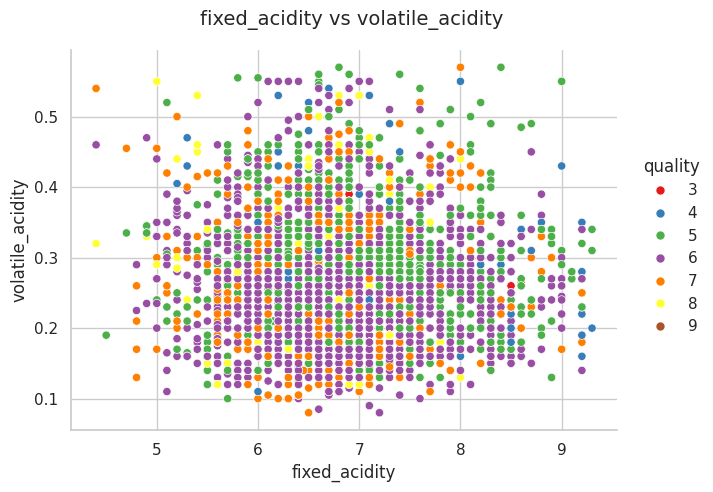

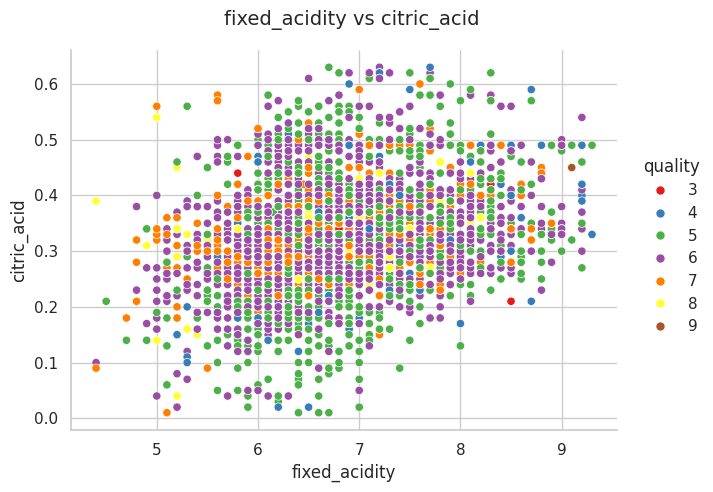

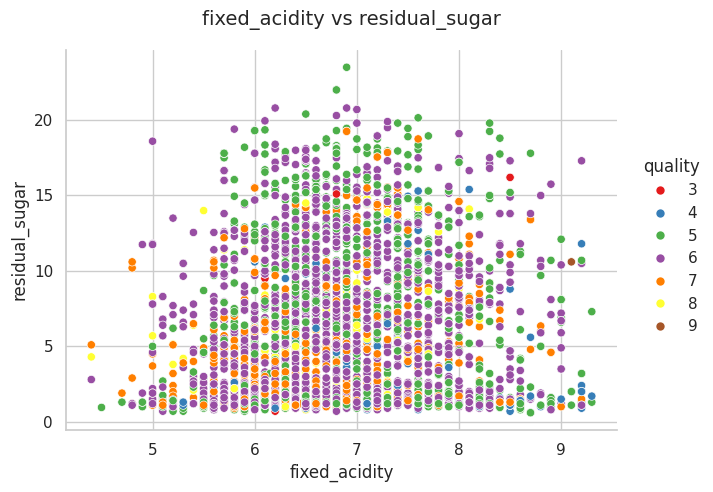

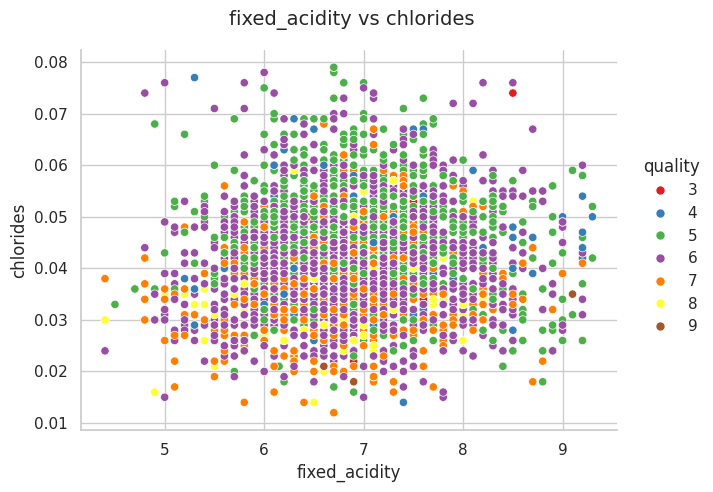

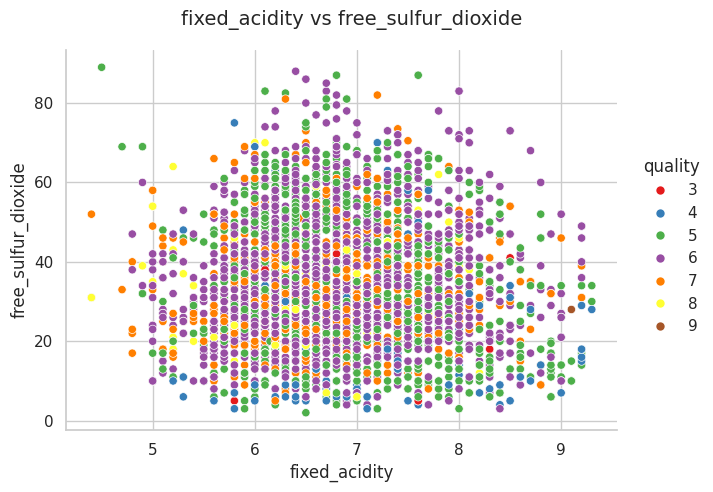

...

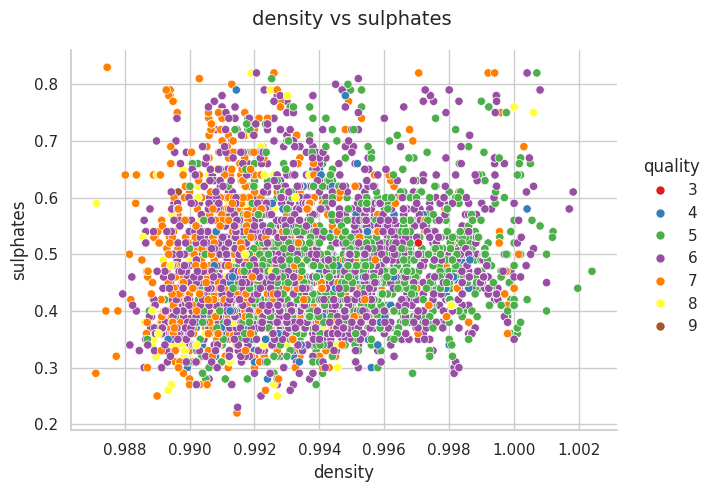

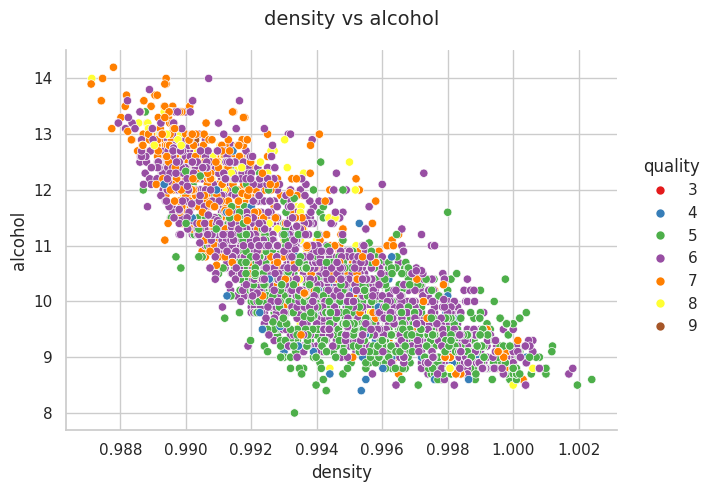

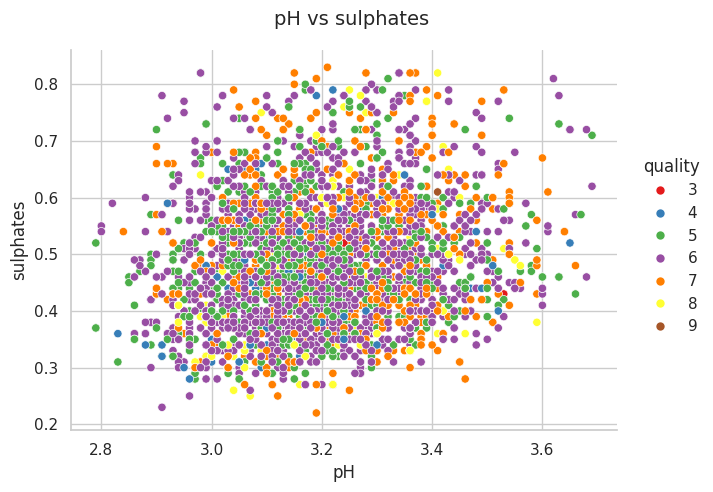

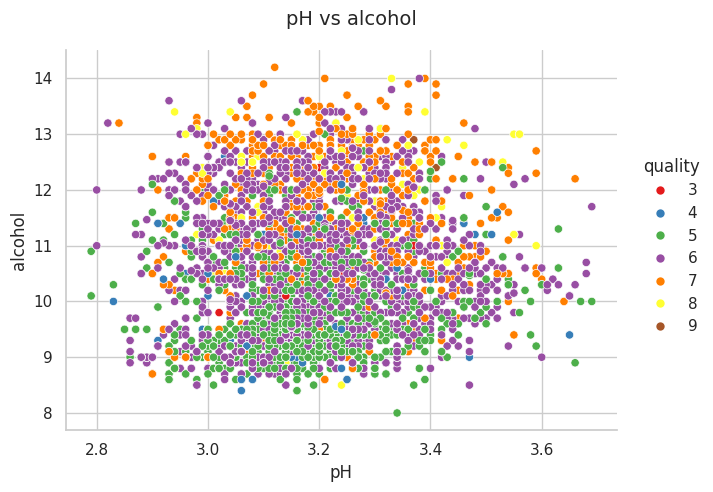

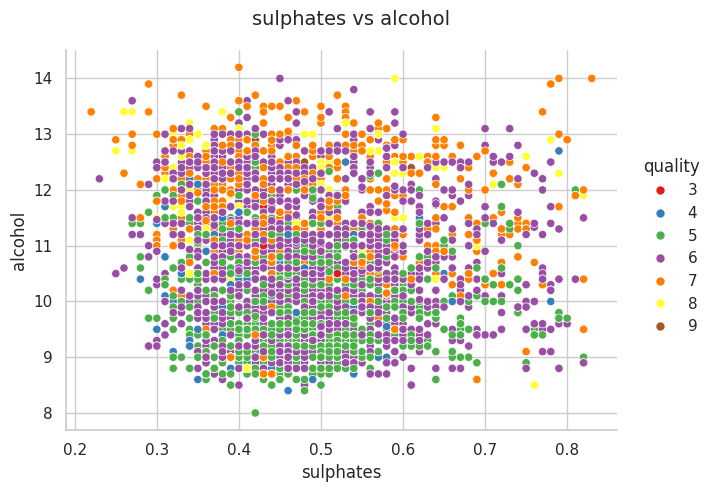

In [269]:
#import seaborn as sns
#import matplotlib.pyplot as plt
import itertools

def relplot(df, x, y, hue=None, style=None):
    sns.set_theme(style="whitegrid")

    # Usamos relplot con argumentos flexibles
    g = sns.relplot(
        data=df,
        x=x,
        y=y,
        hue=hue,
        style=style,
        palette="Set1",  # 🎨 Paleta con colores bien diferenciados
        kind="scatter",
        height=5,
        aspect=1.3
    )

    g.fig.suptitle(f"{x} vs {y}", fontsize=14)
    g.set_axis_labels(x, y)
    g.tight_layout()
    g.fig.subplots_adjust(top=0.9)  # Ajuste para no cortar el título
    plt.show()

# 📊 Generar todos los pares únicos de columnas
features = df.select_dtypes(include=["number"]).columns.tolist()
if "quality" in features:
    features.remove("quality")  # ✅ la quitamos antes de hacer combinaciones

pairs = list(itertools.combinations(features, 2))  # evita x vs y y y vs x duplicado

# 🖼️ Dibujar cada par con relplot
for x, y in pairs:
    #print(f"Generando: {x} vs {y}")
    relplot(df, x, y, hue="quality")

In [270]:
# @title === Nuevas características derivadas para mejorar la predicción ===

# 1. Interacción entre alcohol y densidad
# Aunque alcohol mejora la calidad y densidad la empeora, su interacción puede revelar una relación más compleja.
df['alcohol_density'] = df['alcohol'] * df['density']

# 2. Relación entre acidez fija y volátil
# Esta proporción puede indicar un balance de acidez; valores altos implican menor agresividad en el sabor.
df['acidez_ratio'] = df['fixed_acidity'] / (df['volatile_acidity'] + 1e-5)  # evitamos división por cero

# 3. Efecto de dilución del azúcar
# Cuanto más azúcar con menor densidad, puede indicar presencia de otros líquidos diluyentes.
df['dilucion_efecto'] = df['residual_sugar'] / (df['density'] + 1e-5)

# 4. Proporción entre dióxido total y libre
# Nos ayuda a ver si el conservante está bien balanceado.
df['sulfur_ratio'] = df['total_sulfur_dioxide'] / (df['free_sulfur_dioxide'] + 1e-5)

# 5. Score de equilibrio entre compuestos buenos y malos
# Un resumen que combina sulfatos y alcohol (positivos) y acidez volátil y cloruros (negativos).
df['score_equilibrio'] = (df['alcohol'] * df['sulphates']) / ((df['volatile_acidity'] + 1e-5) * (df['chlorides'] + 1e-5))

# 6. Log-transformación del azúcar residual
# Reduce la varianza de la variable y puede capturar mejor su efecto no lineal.
#df['log_residual_sugar'] = np.log(df['residual_sugar'] + 1)

# 7. Raíz cuadrada del dióxido de azufre total
# Ayuda a estabilizar su escala y reducir el impacto de valores extremos.
#df['sqrt_total_sulfur'] = np.sqrt(df['total_sulfur_dioxide'])

# 8. Inverso de la densidad
# Como la densidad se correlaciona negativamente con la calidad, su inverso podría capturar mejor su efecto.
df['inv_density'] = 1 / (df['density'] + 1e-5)

# Mostramos las nuevas columnas
df[['alcohol_density', 'acidez_ratio', 'dilucion_efecto', 'sulfur_ratio',
          'score_equilibrio',
    # 'log_residual_sugar', 'sqrt_total_sulfur',
    'inv_density']].head()

,alcohol_density,acidez_ratio,dilucion_efecto,sulfur_ratio,score_equilibrio,inv_density
1599,8.80880,25.924966,20.679114,3.777777,325.841446,0.998991
1600,9.44300,20.999300,1.609642,9.428565,316.591501,1.006026
1601,10.05051,28.927538,6.933907,3.233332,317.353764,1.004914
1602,9.85644,31.302987,8.537480,3.957446,296.787498,1.004409
1603,9.85644,31.302987,8.537480,3.957446,296.787498,1.004409


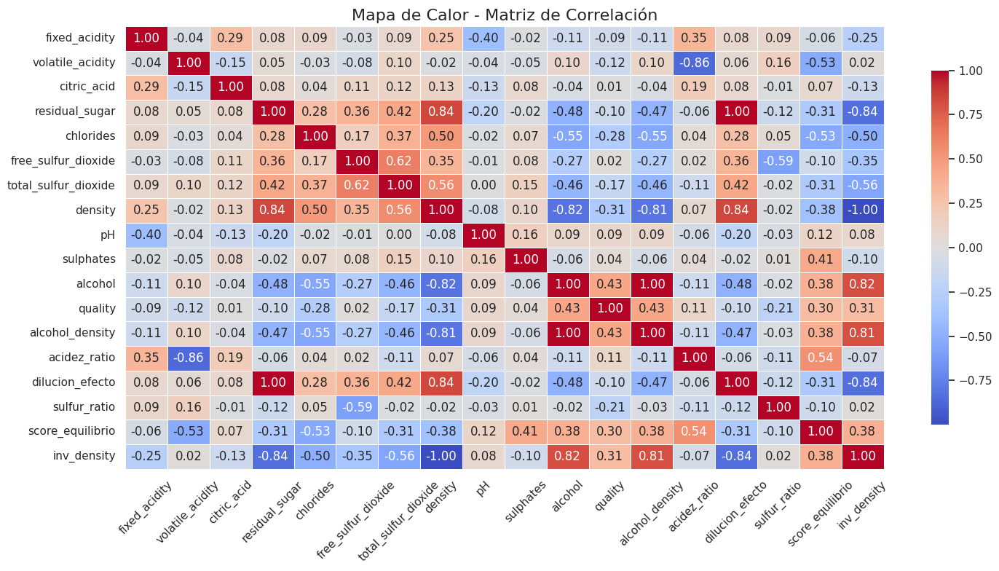

In [271]:
# @title Mapa de Correlación
import seaborn as sns
import matplotlib.pyplot as plt

def plot_correlation_heatmap(df, title="Mapa de Calor - Matriz de Correlación"):
    """
    Genera un heatmap de la matriz de correlación para un DataFrame.

    Parámetros:
    - df: pandas.DataFrame
    - title: str (título del gráfico)
    """
    # Calcula la matriz de correlación solo con columnas numéricas
    corr = df.corr(numeric_only=True)
    #print(corr)

    # Configuración del estilo
    sns.set_theme(style="white")

    # Crear el heatmap
    plt.figure(figsize=(15, 8))
    sns.heatmap(
        corr,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        cbar_kws={"shrink": 0.8}
    )
    plt.title(title, fontsize=16)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# Llamada a la función con tu dataset
plot_correlation_heatmap(df)


In [272]:
# @title Mayor correlación con la variable a predecir
#-------------------------------------------------------------------------------------
# Calcula la correlación de todas las columnas con 'quality'
corr = df.corr(numeric_only=True)
correlation_with_quality = corr['quality'].abs()

# Selecciona las columnas donde la correlación absoluta es mayor a 0.1
highly_correlated_features = correlation_with_quality[correlation_with_quality > 0.1].index.tolist()
highly_correlated_features.remove('quality')
# Ordenar las características por su correlación absoluta con 'quality' en orden descendente
highly_correlated_features_sorted = correlation_with_quality[highly_correlated_features].sort_values(ascending=False)

# Crear un DataFrame para una mejor presentación tabular
df_correlated = pd.DataFrame({
    'Característica': highly_correlated_features_sorted.index,
    'Correlación Absoluta con Quality': highly_correlated_features_sorted.values
})

print("### Columnas con mayor correlación absoluta con 'quality' (orden descendente):")

# Imprimir el DataFrame
display(df_correlated)

### Columnas con mayor correlación absoluta con 'quality' (orden descendente):


,Característica,Correlación Absoluta con Quality
0,alcohol_density,0.434940
1,alcohol,0.434065
2,inv_density,0.306640
3,density,0.306096
4,score_equilibrio,0.301580
5,chlorides,0.284379
6,sulfur_ratio,0.212740
7,total_sulfur_dioxide,0.165215
8,volatile_acidity,0.123289
9,acidez_ratio,0.108668


### **Seleccionando las variables más importantes para el entrenamiento**
---
Descartamos las que tienen relacion con otras variables ya que seria una redundancia para el entenamiento, como el **alcohol,chlorides** y **density** ya que son parte de las nuevas variables compuestas que entregan mayor información

In [273]:
# @title Variables seleccionadas para normalizar y realizar el entrenamiento
#variables_select=variables
#variables_select.remove('color')

variables_select=['alcohol_density','score_equilibrio','inv_density','volatile_acidity','acidez_ratio','sulfur_ratio']


### **Reconfiguracion de la variable de clasificación**
Vamos a cambiar la extru

<ipython-input-274-5934a7a7b1a9>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=conteo_calidades.index, y=conteo_calidades.values, palette='viridis') # Usa una paleta de colores


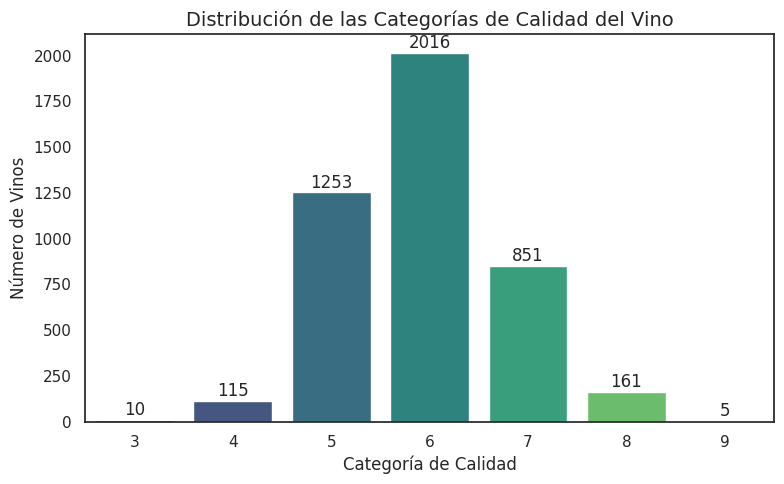

In [274]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Contar la frecuencia de cada categoría en 'y'
conteo_calidades = df['quality'].value_counts().sort_index()

# 2. Crear el diagrama de barras
plt.figure(figsize=(8, 5)) # Ajusta el tamaño de la figura si es necesario
sns.barplot(x=conteo_calidades.index, y=conteo_calidades.values, palette='viridis') # Usa una paleta de colores

# 3. Añadir título y etiquetas
plt.title("Distribución de las Categorías de Calidad del Vino", fontsize=14)
plt.xlabel("Categoría de Calidad", fontsize=12)
plt.ylabel("Número de Vinos", fontsize=12)
plt.xticks(rotation=0) # Para asegurar que las etiquetas del eje x no se superpongan

# 4. Mostrar los valores en las barras (opcional)
for index, value in enumerate(conteo_calidades.values):
    plt.text(index, value + 5, str(value), ha='center', va='bottom')

# 5. Mostrar el gráfico
plt.tight_layout() # Ajusta automáticamente los parámetros de la subtrama para que encajen en el área de la figura
plt.show()

In [275]:
y=df["quality"].copy()
# Definir el mapeo de los valores antiguos a los nuevos
reemplazo_calidad = {
    1: 1,
    2: 1,
    3: 1,
    4: 1,
    5: 1,
    6: 2,
    7: 2,
    8: 2,
    9: 2,
    10: 2
}

# Aplicar el reemplazo a la columna 'quality' en el DataFrame y
# asegurarnos de que los cambios se apliquen al DataFrame original si es necesario
y = y.replace(reemplazo_calidad)

# Opcional: Mostrar los valores únicos en la columna 'quality' después del reemplazo
print("Valores únicos en la columna 'quality' después del reemplazo:")
print(y.unique())

# Opcional: Mostrar las primeras filas para ver los cambios
print("\nPrimeras filas de 'y' después del reemplazo:")
print(y.head())

Valores únicos en la columna 'quality' después del reemplazo:
[2 1]

Primeras filas de 'y' después del reemplazo:
1599    2
1600    2
1601    2
1602    2
1603    2
Name: quality, dtype: int64


<ipython-input-276-6c7a7e9735d1>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=conteo_calidades.index, y=conteo_calidades.values, palette='viridis') # Usa una paleta de colores


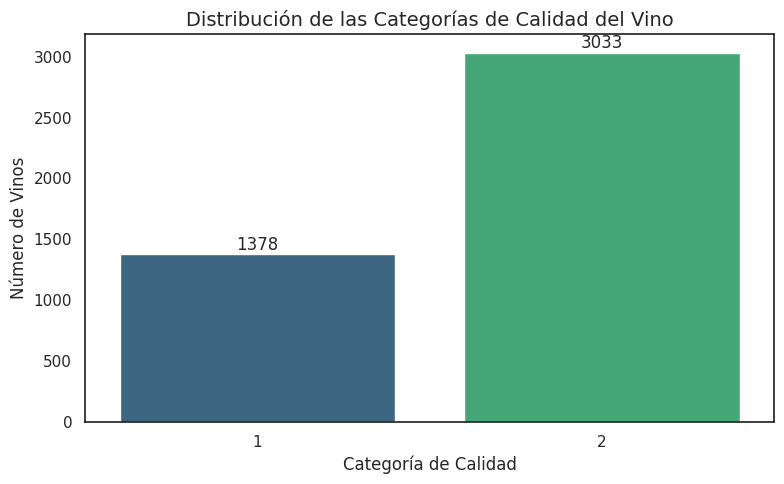

In [276]:
# @title Grafica de distribucion de vinos
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Contar la frecuencia de cada categoría en 'y'
conteo_calidades = y.value_counts().sort_index()

# 2. Crear el diagrama de barras
plt.figure(figsize=(8, 5)) # Ajusta el tamaño de la figura si es necesario
sns.barplot(x=conteo_calidades.index, y=conteo_calidades.values, palette='viridis') # Usa una paleta de colores

# 3. Añadir título y etiquetas
plt.title("Distribución de las Categorías de Calidad del Vino", fontsize=14)
plt.xlabel("Categoría de Calidad", fontsize=12)
plt.ylabel("Número de Vinos", fontsize=12)
plt.xticks(rotation=0) # Para asegurar que las etiquetas del eje x no se superpongan

# 4. Mostrar los valores en las barras (opcional)
for index, value in enumerate(conteo_calidades.values):
    plt.text(index, value + 5, str(value), ha='center', va='bottom')

# 5. Mostrar el gráfico
plt.tight_layout() # Ajusta automáticamente los parámetros de la subtrama para que encajen en el área de la figura
plt.show()

In [277]:
# @title normalización de Valores utilizando Z-score
# utlizamos z-score ya que los datos no estan normalizados y decidimos conservar los valores atipicos ya que de algun modo
# nos brindan cierta información
from sklearn.preprocessing import StandardScaler

def normalize_columns_zscore(df, columns_to_normalize):
  """
  Normalizes specified columns of a DataFrame using Z-score.

  Args:
    df: The input pandas DataFrame.
    columns_to_normalize: A list of column names to normalize.

  Returns:
    A new pandas DataFrame containing only the normalized columns.
  """
  # Create a StandardScaler instance
  scaler = StandardScaler()

  # Apply Z-score normalization to the specified columns
  # We use .copy() to avoid SettingWithCopyWarning
  df_normalized = df[columns_to_normalize].copy()
  df_normalized[columns_to_normalize] = scaler.fit_transform(df_normalized[columns_to_normalize])

  return df_normalized



In [278]:
df_normalized_selected = normalize_columns_zscore(df, variables_select)
print("Normalized selected columns:")
display(df_normalized_selected.head())
if variant == 3:
    variables_select.append('isRed')
print(variables_select)

Normalized selected columns:


,alcohol_density,score_equilibrio,inv_density,volatile_acidity,acidez_ratio,sulfur_ratio
1599,-1.417003,-0.699861,-2.419449,0.004620,-0.211593,-0.317193
1600,-0.883162,-0.731354,-0.025986,0.361085,-0.709701,1.649578
1601,-0.371787,-0.728759,-0.404332,0.123442,0.092043,-0.506689
1602,-0.535147,-0.798782,-0.576031,-0.470667,0.332260,-0.254659
1603,-0.535147,-0.798782,-0.576031,-0.470667,0.332260,-0.254659


['alcohol_density', 'score_equilibrio', 'inv_density', 'volatile_acidity', 'acidez_ratio', 'sulfur_ratio']


## Dividiendo el dataset para **Entrenamiento,Prueba**
---

In [279]:
from sklearn.model_selection import train_test_split
print(df_normalized_selected.shape)
print(y.shape)

# Divide los datos en conjuntos de entrenamiento y prueba
X_train, X_test, Y_train, Y_test = train_test_split(
    df_normalized_selected,  # Características (variables normalizadas)
    y,                       # Variable objetivo
    test_size=0.2,           # Proporción de datos para el conjunto de prueba (20%)
    random_state=42          # Semilla para reproducibilidad
)

print("Dimensiones de los conjuntos:")
print(f"X_train: {X_train.shape}")
print(f"Y_train: {Y_train.shape}")
print(f"X_test: {X_test.shape}")
print(f"Y_test: {Y_test.shape}")

(4411, 6)
(4411,)
Dimensiones de los conjuntos:
X_train: (3528, 6)
Y_train: (3528,)
X_test: (883, 6)
Y_test: (883,)


In [280]:
### Generando el modelo de regresión lineal
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import pandas as pd

# Diccionario para almacenar los modelos
models = {
    "Regresión Logística": LogisticRegression(random_state=42, max_iter=1000),
    "SVM": SVC(random_state=42),
    "Árbol de Decisión": DecisionTreeClassifier(random_state=42),
    "Bosque Aleatorio": RandomForestClassifier(random_state=42),
    "KNN": KNeighborsClassifier()
}

# DataFrame para almacenar los resultados de la evaluación
results = pd.DataFrame(columns=["Modelo", "Precisión (Accuracy)"])

print("Comparando Modelos de Clasificación...")

for name, model in models.items():
    print(f"\nEntrenando {name}...")
    # Entrenar el modelo
    model.fit(X_train, Y_train.values.ravel())

    # Realizar predicciones en el conjunto de prueba
    Y_pred = model.predict(X_test)

    # Evaluar la precisión
    accuracy = accuracy_score(Y_test, Y_pred)

    print(f"Precisión de {name}: {accuracy:.2f}")

    # Añadir resultados al DataFrame
    results = pd.concat([results, pd.DataFrame([{"Modelo": name, "Precisión (Accuracy)": accuracy}])], ignore_index=True)


print("\n--- Resultados de la Comparación de Modelos ---")
# Ordenar los resultados por precisión en orden descendente
results_sorted = results.sort_values(by="Precisión (Accuracy)", ascending=False)
display(results_sorted)

print("\nEl mejor modelo basado en la precisión es:")
print(results_sorted.iloc[0])

Comparando Modelos de Clasificación...

Entrenando Regresión Logística...
Precisión de Regresión Logística: 0.75

Entrenando SVM...


<ipython-input-280-be456fcc2a51>:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, pd.DataFrame([{"Modelo": name, "Precisión (Accuracy)": accuracy}])], ignore_index=True)


Precisión de SVM: 0.76

Entrenando Árbol de Decisión...
Precisión de Árbol de Decisión: 0.78

Entrenando Bosque Aleatorio...
Precisión de Bosque Aleatorio: 0.83

Entrenando KNN...
Precisión de KNN: 0.76

--- Resultados de la Comparación de Modelos ---


,Modelo,Precisión (Accuracy)
3,Bosque Aleatorio,0.834655
2,Árbol de Decisión,0.778029
1,SVM,0.758777
4,KNN,0.758777
0,Regresión Logística,0.754247



El mejor modelo basado en la precisión es:
Modelo                  Bosque Aleatorio
Precisión (Accuracy)            0.834655
Name: 3, dtype: object


In [281]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# 1. Crear una instancia del modelo de Regresión Logística
# Puedes ajustar los parámetros según sea necesario (ver documentación de scikit-learn) [1]

model = RandomForestClassifier(
    n_estimators=200,       # Más árboles
    criterion='gini',       # Criterio de división (gini o entropy)
    max_depth=19,           # Profundidad máxima de los árboles para evitar sobreajuste
    min_samples_split=10,    # Mínimo de muestras para dividir un nodo
    min_samples_leaf=3,     # Mínimo de muestras en un nodo hoja
    max_features='sqrt',    # Número de características a considerar en cada división [1]
    random_state=42,        # Para reproducibilidad
    n_jobs=-1               # Usar todos los núcleos de la CPU para paralelizar el entrenamiento
)

# 2. Entrenar el modelo con los datos de entrenamiento
print("Entrenando el modelo de Regresión Logística...")
model.fit(X_train, Y_train.values.ravel()) # .values.ravel() convierte el DataFrame a un array 1D

print("Entrenamiento completado.")

# 3. Realizar predicciones en el conjunto de prueba
Y_pred = model.predict(X_test)

# 4. Evaluar el rendimiento del modelo
print("\n--- Evaluación del Modelo ---")

# Precisión (Accuracy)
accuracy = accuracy_score(Y_test, Y_pred)
print(f"Precisión (Accuracy): {accuracy:.2f}")

# Reporte de Clasificación (incluye precisión, recall, f1-score por clase)
print("\nReporte de Clasificación:")
print(classification_report(Y_test, Y_pred))

# Matriz de Confusión
print("\nMatriz de Confusión:")
conf_matrix = confusion_matrix(Y_test, Y_pred)
print(conf_matrix)

Entrenando el modelo de Regresión Logística...
Entrenamiento completado.

--- Evaluación del Modelo ---
Precisión (Accuracy): 0.82

Reporte de Clasificación:
              precision    recall  f1-score   support

           1       0.72      0.66      0.69       268
           2       0.86      0.89      0.87       615

    accuracy                           0.82       883
   macro avg       0.79      0.78      0.78       883
weighted avg       0.82      0.82      0.82       883


Matriz de Confusión:
[[178  90]
 [ 70 545]]


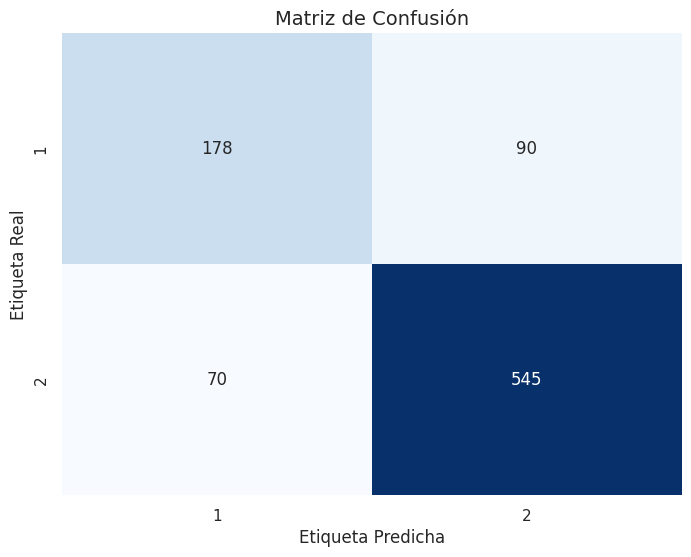

In [282]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix # Asegurarse de importar si no está ya en la celda

# Suponiendo que Y_test y Y_pred ya están definidos y calculados
# conf_matrix = confusion_matrix(Y_test, Y_pred) # Ya calculada en tu código anterior

plt.figure(figsize=(8, 6)) # Ajusta el tamaño de la figura si es necesario
sns.heatmap(
    conf_matrix,
    annot=True,          # Muestra los números en cada celda
    fmt='d',             # Formato de los números como enteros
    cmap='Blues',        # Paleta de colores (puedes probar 'viridis', 'plasma', 'YlGnBu', etc.)
    cbar=False,          # No mostrar la barra de color (ya que los números están visibles)
    xticklabels=model.classes_, # Etiquetas para el eje X (predicho)
    yticklabels=model.classes_  # Etiquetas para el eje Y (real)
)

plt.xlabel('Etiqueta Predicha', fontsize=12)
plt.ylabel('Etiqueta Real', fontsize=12)
plt.title('Matriz de Confusión', fontsize=14)
plt.show()